<a href="https://colab.research.google.com/github/harindukodi/deep-learning-COSC2779-assign-1/blob/master/Model_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 

import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE
import numpy as np
import pandas as pd

import pathlib
import shutil
import tempfile

from  IPython import display
from matplotlib import pyplot as plt
from sklearn.metrics import roc_auc_score

In [2]:
tf.__version__

'2.3.0'

In [67]:
logdir = pathlib.Path(tempfile.mkdtemp())/"tensorboard_logs"
shutil.rmtree(logdir, ignore_errors=True)

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Open an embedded TensorBoard viewer
%tensorboard --logdir {logdir}/models

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [4]:
from itertools import cycle
def plotter(history_hold, metric = 'mean_absolute_error', ylim=[0.0, 1.0]):
  cycol = cycle('bgrcmk')
  for name, item in history_hold.items():
    y_train = item.history[metric]
    y_val = item.history['val_' + metric]
    x_train = np.arange(0,len(y_val))

    c=next(cycol)

    plt.plot(x_train, y_train, c+'-', label=name+'_train')
    plt.plot(x_train, y_val, c+'--', label=name+'_val')

  plt.legend()
  plt.xlim([1, max(plt.xlim())])
  plt.ylim(ylim)
  plt.xlabel('Epoch')
  plt.ylabel(metric)
  plt.grid(True)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
# import zipfile
# with zipfile.ZipFile('/content/drive/My Drive/DL-Assignment-1/A1_data.zip', 'r') as zip_ref:
#     zip_ref.extractall('/content/drive/My Drive/DL-Assignment-1/')

In [ ]:
# import zipfile
# with zipfile.ZipFile('/content/drive/My Drive/DL-Assignment-1/modified_data.zip', 'r') as zip_ref:
#     zip_ref.extractall('/content/drive/My Drive/DL-Assignment-1/')

In [6]:
data=pd.read_csv("/content/drive/My Drive/DL-Assignment-1/train_data.csv", header=None)

In [7]:
data.head(5)

,0,1,2,3,4
0,filename,person_id,series,tilt,pan
1,face_790.jpg,5,1,-15,30
2,face_2445.jpg,5,1,0,-75
3,face_2266.jpg,5,2,-15,-60
4,face_2713.jpg,5,2,0,-90


In [8]:
data.columns = data.iloc[0]
data.drop(data.index[[0]], inplace=True)

In [9]:
data.notnull().count()

0
filename     2325
person_id    2325
series       2325
tilt         2325
pan          2325
dtype: int64

In [10]:
#Comparing the data types
data.dtypes

0
filename     object
person_id    object
series       object
tilt         object
pan          object
dtype: object

In [11]:
data["tilt"]=data["tilt"].astype(int)
data["pan"]=data["pan"].astype(int)

In [12]:
#Comparing the data types
data.dtypes

0
filename     object
person_id    object
series       object
tilt          int64
pan           int64
dtype: object

In [13]:
data_test = data[data['person_id']=='4'].index

In [14]:
data[data['person_id']=='4'].count()

0
filename     186
person_id    186
series       186
tilt         186
pan          186
dtype: int64

In [15]:
data_test

Int64Index([187, 188, 189, 190, 191, 192, 193, 194, 195, 196,
            ...
            363, 364, 365, 366, 367, 368, 369, 370, 371, 372],
           dtype='int64', length=186)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fece2216d68>,
      dtype=object)

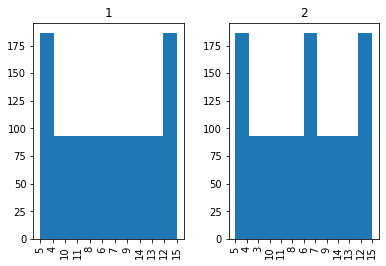

In [16]:
data['person_id'].hist(by=data['series'])

face_1978.jpg
face_1333.jpg
face_2571.jpg
face_2308.jpg


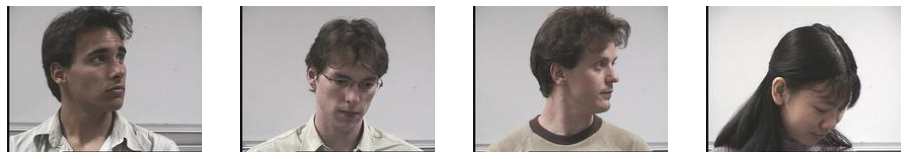

In [17]:
from PIL import Image
import pandas as pd
import glob
r_inx = np.random.choice(2000, 4)
rand_data = data.loc[r_inx,'filename']

plt.figure(figsize=(16,4))
for i, filename in enumerate(rand_data):
    im = np.asarray(Image.open('/content/drive/My Drive/DL-Assignment-1/modified_data/'+filename))
    print(filename)
    plt.subplot(1,4,i+1)
    plt.imshow(im,cmap='gray')
    plt.axis('off')
    
plt.show()

In [18]:
# Delete these row indexes from dataFrame
data.drop(data_test , inplace=True)

In [19]:
data_test

Int64Index([187, 188, 189, 190, 191, 192, 193, 194, 195, 196,
            ...
            363, 364, 365, 366, 367, 368, 369, 370, 371, 372],
           dtype='int64', length=186)

In [20]:
train_dataset = data
train_dataset

,filename,person_id,series,tilt,pan
1,face_790.jpg,5,1,-15,30
2,face_2445.jpg,5,1,0,-75
3,face_2266.jpg,5,2,-15,-60
4,face_2713.jpg,5,2,0,-90
5,face_2016.jpg,5,2,15,-75
...,...,...,...,...,...
2321,face_1977.jpg,15,1,15,90
2322,face_701.jpg,15,1,-15,90
2323,face_1343.jpg,15,1,15,-30
2324,face_851.jpg,15,2,-60,15


In [21]:
data_copy = pd.read_csv("/content/drive/My Drive/DL-Assignment-1/train_data.csv", header=None)
data_copy.columns = data_copy.iloc[0]
data_copy.drop(data_copy.index[[0]], inplace=True)
data_copy["tilt"]=data_copy["tilt"].astype(int)
data_copy["pan"]=data_copy["pan"].astype(int)

In [23]:
test_dataset = data_copy[data_copy['person_id']=='4']
test_dataset

,filename,person_id,series,tilt,pan
187,face_1830.jpg,4,1,60,75
188,face_2363.jpg,4,1,-30,-45
189,face_227.jpg,4,1,-60,-60
190,face_830.jpg,4,2,-30,-15
191,face_2679.jpg,4,1,-15,60
...,...,...,...,...,...
368,face_2601.jpg,4,1,-30,60
369,face_1100.jpg,4,1,-60,30
370,face_2283.jpg,4,1,60,-45
371,face_749.jpg,4,2,60,-90


In [24]:
from sklearn.model_selection import train_test_split

train_df, validation_df = train_test_split(train_dataset, test_size=0.2, shuffle=True)

In [25]:
train_df

,filename,person_id,series,tilt,pan
159,face_413.jpg,5,1,-60,30
1707,face_2164.jpg,14,2,15,90
1982,face_1175.jpg,12,2,0,15
682,face_1684.jpg,11,2,15,-75
930,face_904.jpg,8,1,15,-45
...,...,...,...,...,...
1242,face_640.jpg,7,2,60,-90
803,face_1781.jpg,11,2,-15,45
2213,face_1993.jpg,15,1,-15,-30
1177,face_414.jpg,6,2,30,-90


In [26]:
validation_df

,filename,person_id,series,tilt,pan
1012,face_746.jpg,8,1,30,0
575,face_1618.jpg,10,1,-60,45
44,face_2332.jpg,5,2,-60,-90
2223,face_2685.jpg,15,1,-90,0
811,face_1758.jpg,11,1,-30,-90
...,...,...,...,...,...
520,face_1124.jpg,10,2,0,-60
1729,face_885.jpg,14,1,15,90
1842,face_604.jpg,13,2,60,-45
1110,face_1970.jpg,6,1,30,15


Data Augmentation funcion


In [ ]:
import tensorflow_addons as tfa
import numpy as np 

@tf.function
def rotate_tf(image,ang_deg=15):
    random_angles = tf.random.uniform(shape = (), minval = -np.deg2rad(ang_deg), maxval = np.deg2rad(ang_deg))
    return tfa.image.rotate(image,random_angles)

@tf.function
def convert(image, label):
  image = tf.image.convert_image_dtype(image, tf.float32) # Cast and normalize the image to [0,1]
  return image, label

@tf.function
def augment(image,label):
  image,label = convert(image, label)
  image = tf.image.resize_with_crop_or_pad(image, 40, 40) # Add 8 pixels of padding
  image = rotate_tf(image, 10) # Rorate in the range [0,10]
  image = tf.image.random_crop(image, size=[32, 32, 3]) # Random crop back to 32x23
  image = tf.image.random_flip_left_right(image)
  image = tf.image.random_brightness(image, max_delta=0.1) # Random brightness

  return image,label

In [27]:
import tensorflow.keras as keras
from scipy.interpolate import interp1d
import numpy as np
from scipy.ndimage.interpolation import rotate, shift
from PIL import Image

class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, data_frame, batch_size=8, dim=(32, 32, 3), n_classes=2, data_mean=0, data_std=1,  data_prefix='', shuffle=True, Augment=True):
        'Initialization'
        self.dim = dim  # Dimentions of the input
        self.batch_size = batch_size
        self.n_classes = n_classes  # Number of classes. This is for a classification task
        
        self.shuffle = shuffle  # Flag to shuffle data at the end of epoch
        self.Augment = Augment  # Falg to augmetn the data

        # The data is input as a pandas dataframe, we need to read the relevent fields
        self.data_frame = data_frame
        self.image_label_tilt = data_frame['tilt'].values.tolist()
        self.image_label_pan = data_frame['pan'].values.tolist()
        self.image_ids = np.arange(len(self.image_label_tilt)).tolist()
        self.data_prefix = data_prefix
        
        # Data normalization parameters
        self.data_mean = data_mean
        self.data_std = data_std
        
        self.on_epoch_end()
        
    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.image_ids) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data for the given index'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        
        # Find list of IDs
        data_ids_temp = [self.image_ids[k] for k in indexes]
        image_label_tilt_temp = [self.image_label_tilt[k] for k in indexes]
        image_label_pan_temp = [self.image_label_pan[k] for k in indexes]
        
        # Generate data
        X, tilt, pan = self.__data_generation(data_ids_temp, image_label_tilt_temp,image_label_pan_temp)
        
        return X, {'tilt':tilt,'pan':pan}

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.image_ids))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)
            
        
    # Support function

    def __data_generation(self, data_ids_temp, image_label_tilt_temp, image_label_pan_temp):
        'Generates data containing batch_size samples' 

        # Initialization
        X = np.empty((self.batch_size, *self.dim))
        y_1 = np.empty((self.batch_size), dtype=int)
        y_2 = np.empty((self.batch_size), dtype=int)
        
        # Generate data
        for i, ids in enumerate(data_ids_temp):
            
            X[i,] = self.__read_data_instance(data_ids_temp[i])
            y_1[i] = image_label_tilt_temp[i]
            y_2[i] = image_label_pan_temp[i]
            
        return X, y_1, y_2


    def __read_data_instance(self, pid):
      # Read an image
      # print(pid)
      # print(self.data_frame.iloc[pid])
      filepath = self.data_prefix + self.data_frame.iloc[pid]['filename']

      
      data = Image.open('/content/drive/My Drive/DL-Assignment-1/modified_data/'+filepath)
      
      data = data.resize((32,32))
      data = np.asarray(data)


      # print(data.shape)
      # data = np.expand_dims(data, axis=-1)
      # print('teset_1')

      # if self.Augment:
      #     rot = np.random.rand(1) < 0.5
      #     if rot:
      #         rot = np.random.randint(-10,10, size=1)
      #         data = rotate(data, angle=rot[0], reshape=False)
          
      #     shift_val = np.random.randint(-5, high=5, size=2, dtype=int).tolist() + [0,]
      #     data = shift(data, shift_val, order=0, mode='constant', cval=0.0, prefilter=False)

      X = data


      # plt.figure(figsize=(192,144))
      # plt.subplot(1,4,i+1)
      # plt.imshow(data,cmap='gray')
      # plt.axis('off') 
      # plt.show()

      # Input normalization
      X = (X - self.data_mean)/self.data_std
      return X

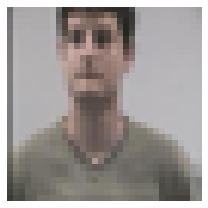

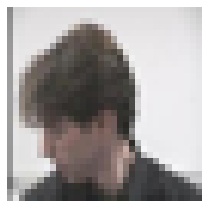

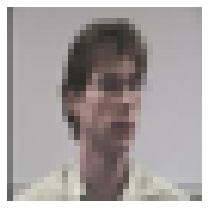

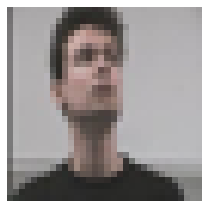

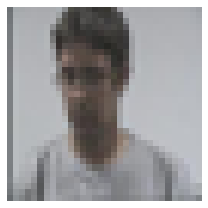

...

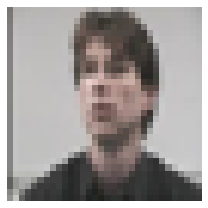

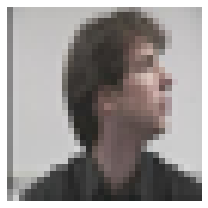

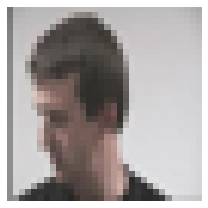

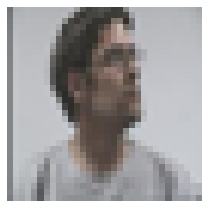

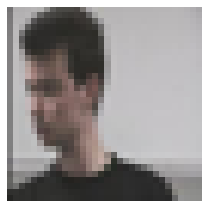

test


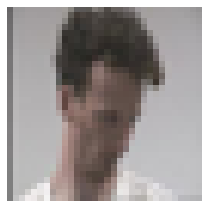

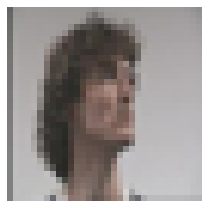

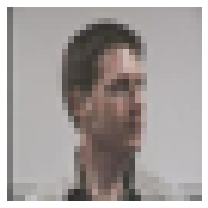

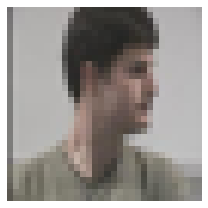

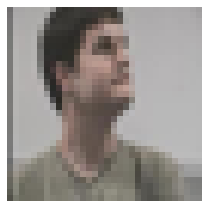

...

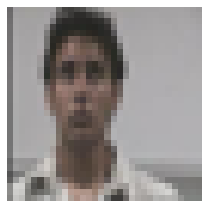

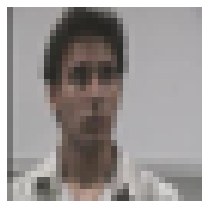

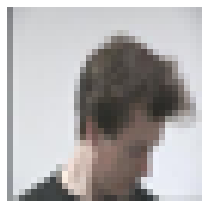

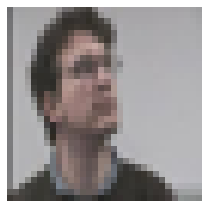

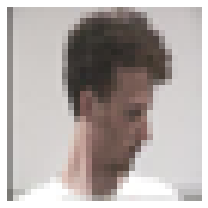

test


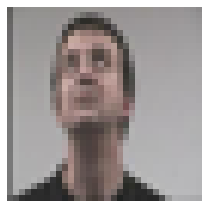

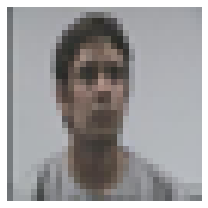

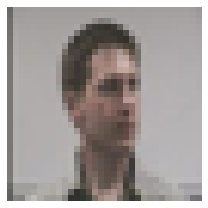

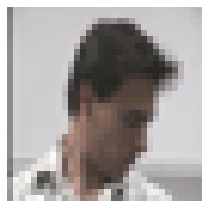

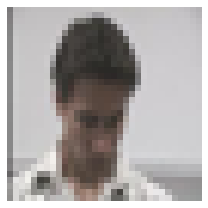

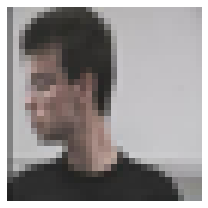

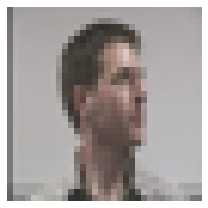

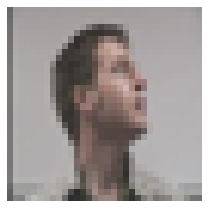

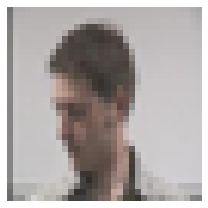

KeyboardInterrupt: ignored

In [ ]:
# for x,y in training_generator.__iter__():
#   print('test')


In [79]:
data_mean = 0.
data_std = 255.0
BATCH_SIZE = 64
prefix=''
training_generator = DataGenerator(train_df, batch_size=BATCH_SIZE, data_mean=data_mean, data_std=data_std, n_classes=0, Augment=True, data_prefix=prefix)
validation_generator = DataGenerator(validation_df, batch_size=BATCH_SIZE, data_mean=data_mean, data_std=data_std, n_classes=0, Augment=False, data_prefix=prefix)
test_generator = DataGenerator(test_dataset, batch_size=BATCH_SIZE, data_mean=data_mean, data_std=data_std, n_classes=0, Augment=False, data_prefix=prefix)

nEpochs = 250

In [68]:
m_histories = {}

def get_callbacks(name):
  return [
    tf.keras.callbacks.TensorBoard(logdir/name, histogram_freq=1),
  ]

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Lambda, Input
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras import regularizers, optimizers

def get_model():
  model_cnn = Sequential()

  # input
  model_cnn.add(Input(shape=(32, 32, 3)))

  # Conv Layer 1
  model_cnn.add(Conv2D(32, (3, 3),kernel_regularizer=regularizers.l2(0.001)))
  model_cnn.add(Activation('relu'))
  model_cnn.add(MaxPooling2D(pool_size=(2, 2)))

  # Conv Layer 2 (no pooling)
  model_cnn.add(Conv2D(32, (3, 3),kernel_regularizer=regularizers.l2(0.001)))
  model_cnn.add(Activation('relu'))

  # Conv Layer 3
  model_cnn.add(Conv2D(64, (3, 3)))
  model_cnn.add(Activation('relu'))
  model_cnn.add(MaxPooling2D(pool_size=(2, 2)))

  # MLP
  model_cnn.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
  model_cnn.add(Dropout(0.5))
  model_cnn.add(Dense(64))
  model_cnn.add(Activation('relu'))
  #model_cnn.add(Dropout(0.5))
  model_cnn.add(Dense(4))
  model_cnn.add(Activation('softmax'))

  
  return model_cnn

In [ ]:
class ResidualBlock(tf.keras.layers.Layer):

    # Initialize components of the model
    def __init__(self, filter_num, stride=1, reg_lambda=0.0):
        super(ResidualBlock, self).__init__()
        self.conv1 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(3, 3),
                                            strides=stride,
                                            kernel_initializer="he_normal",
                                            kernel_regularizer=tf.keras.regularizers.l2(reg_lambda),
                                            padding="same")
        self.bn1 = tf.keras.layers.BatchNormalization(momentum=.4)
        self.conv2 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(3, 3),
                                            strides=1,
                                            kernel_initializer="he_normal",
                                            kernel_regularizer=tf.keras.regularizers.l2(reg_lambda),
                                            padding="same")
        self.bn2 = tf.keras.layers.BatchNormalization(momentum=.4)
        if stride != 1:
            self.downsample = tf.keras.Sequential()
            self.downsample.add(tf.keras.layers.Conv2D(filters=filter_num,
                                                       kernel_size=(1, 1),
                                                       kernel_initializer="he_normal",
                                                       kernel_regularizer=tf.keras.regularizers.l2(reg_lambda),
                                                       strides=stride))
            self.downsample.add(tf.keras.layers.BatchNormalization(momentum=.4))
        else:
            self.downsample = lambda x: x

    # Define the forward function
    def call(self, inputs, training=None, **kwargs):
        residual = self.downsample(inputs)

        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv2(x)
        x = self.bn2(x, training=training)

        output = tf.nn.relu(tf.keras.layers.add([residual, x]))

        return output

    def get_config(self):

        config = super().get_config().copy()
        config.update({
            'conv1': self.conv1,
            'bn1': self.bn1,
            'conv2': self.conv2,
            'bn2': self.bn2,
            'downsample': self.downsample,
        })
        return config

In [ ]:
def get_resnet_model(filters, block_size, reg_lambda=0.0, fdropout=False):
  model = tf.keras.Sequential()

  #initial segment
  model.add(tf.keras.layers.Conv2D(filters=64,
                                   kernel_size=(3, 3),
                                   strides=1,
                                   kernel_initializer="he_normal",
                                   kernel_regularizer=tf.keras.regularizers.l2(reg_lambda),
                                   padding="same", input_shape=(32, 32, 3)))
  model.add(tf.keras.layers.BatchNormalization(momentum=.4))

  #Stack of residual blocks
  for nFilters, nBlocks in zip(filters, block_size):
    model.add(ResidualBlock(nFilters, stride=2, reg_lambda=reg_lambda))
    
    for _ in range(1, nBlocks):
      model.add(ResidualBlock(nFilters, stride=1, reg_lambda=reg_lambda))

  # Final part
  model.add(tf.keras.layers.GlobalAveragePooling2D())
  model.add(tf.keras.layers.Flatten())
  pan = model.add(tf.keras.layers.Dense(10, 
                                  activation=tf.nn.softmax, 
                                  kernel_regularizer=tf.keras.regularizers.l2(reg_lambda),
                                  kernel_initializer="he_normal"))
  tilt = model.add(tf.keras.layers.Dense(10, 
                                  activation=tf.nn.softmax, 
                                  kernel_regularizer=tf.keras.regularizers.l2(reg_lambda),
                                  kernel_initializer="he_normal"))

  return model

In [ ]:
tiny_res_net = get_resnet_model([64,], [1,])
tiny_res_net.compile(loss={'tilt':'mse', 'pan':'mse'}, loss_weights={'tilt':1, 'pan':1}, optimizer='RMSprop', metrics=[tf.keras.metrics.MeanAbsoluteError()])

m_histories['harindu_test_2'] = tiny_res_net.fit(training_generator, epochs=10, validation_data=validation_generator, callbacks=get_callbacks('models/harindu_test_2'))

# plotter(m_histories, ylim=[0.0, 2.5], metric = 'SparseCategoricalCrossentropy')

Epoch 1/10


ValueError: ignored

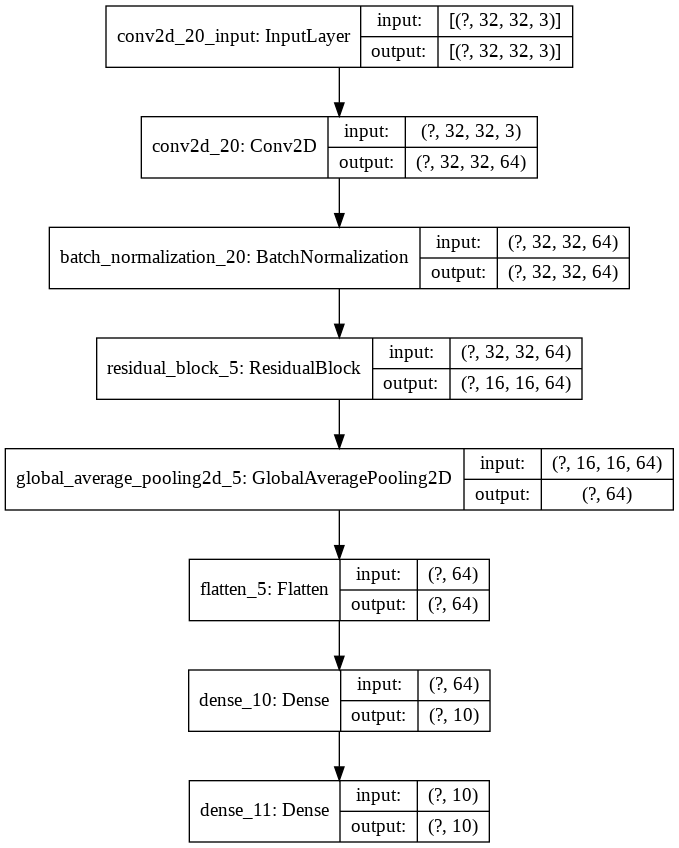

In [ ]:
tf.keras.utils.plot_model(tiny_res_net,'test.png',show_shapes=True)

In [ ]:
from tensorflow import Tensor
from tensorflow.keras.layers import Input, Conv2D, ReLU, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense
from tensorflow.keras.models import Model

def relu_bn(inputs: Tensor) -> Tensor:
    relu = ReLU()(inputs)
    # bn = BatchNormalization()(relu)
    return relu

def residual_block(x: Tensor, downsample: bool, filters: int, kernel_size: int = 3) -> Tensor:
    y = Conv2D(kernel_size=kernel_size,
               strides= (1 if not downsample else 2),
               filters=filters,
               padding="same")(x)
    y = relu_bn(y)
    y = Conv2D(kernel_size=kernel_size,
               strides=1,
               filters=filters,
               padding="same")(y)

    if downsample:
        x = Conv2D(kernel_size=1,
                   strides=2,
                   filters=filters,
                   padding="same")(x)
    out = Add()([x, y])
    out = relu_bn(out)
    return out

def create_res_net():
    
    inputs = Input(shape=(32, 32, 3))
    num_filters = 64
    
    t = BatchNormalization()(inputs)
    t = Conv2D(kernel_size=3,
               strides=1,
               filters=num_filters,
               padding="same")(t)
    t = relu_bn(t)
    
    num_blocks_list = [2, 5, 5, 2]
    for i in range(len(num_blocks_list)):
        num_blocks = num_blocks_list[i]
        for j in range(num_blocks):
            t = residual_block(t, downsample=(j==0 and i!=0), filters=num_filters)
        num_filters *= 2
    
    t = AveragePooling2D(4)(t)
    t = Flatten()(t)

    pan = Dense(10, activation='softmax', name='pan')(t)
    tilt = Dense(32, activation='softmax', name='tilt')(t)
    
    model = Model(inputs=inputs, outputs=[tilt, pan])

    model.compile(loss={'tilt':'mse', 'pan':'mse'}, loss_weights={'tilt':1, 'pan':1}, optimizer='RMSprop', metrics=[tf.keras.metrics.MeanAbsoluteError()])

    return model

In [ ]:
resNet_model_1 = create_res_net()
m_histories['harindu_test_5'] = resNet_model_1.fit(training_generator, epochs=100, validation_data=validation_generator, callbacks=get_callbacks('models/harindu_test_5'))

# plotter(m_histories, ylim=[0.0, 2.5], metric = 'mean_absolute_error')

Epoch 1/100
53/53 [==============================] - 7s 123ms/step - loss: 4618.8496 - tilt_loss: 1523.3064 - pan_loss: 3095.5425 - tilt_mean_absolute_error: 31.6319 - pan_mean_absolute_error: 47.5303 - val_loss: 4480.4111 - val_tilt_loss: 1391.5945 - val_pan_loss: 3088.8164 - val_tilt_mean_absolute_error: 30.1840 - val_pan_mean_absolute_error: 47.7519
Epoch 2/100
53/53 [==============================] - 6s 110ms/step - loss: 4594.9468 - tilt_loss: 1522.3826 - pan_loss: 3072.5630 - tilt_mean_absolute_error: 31.6408 - pan_mean_absolute_error: 47.2737 - val_loss: 4513.3594 - val_tilt_loss: 1392.1196 - val_pan_loss: 3121.2395 - val_tilt_mean_absolute_error: 29.9315 - val_pan_mean_absolute_error: 47.9683
Epoch 3/100
53/53 [==============================] - 6s 112ms/step - loss: 4595.6084 - tilt_loss: 1510.1740 - pan_loss: 3085.4333 - tilt_mean_absolute_error: 31.5346 - pan_mean_absolute_error: 47.4416 - val_loss: 4474.7954 - val_tilt_loss: 1374.8300 - val_pan_loss: 3099.9653 - val_tilt_mea

KeyboardInterrupt: ignored

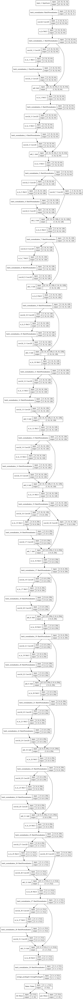

In [ ]:
tf.keras.utils.plot_model(resNet_model_1,'test.png',show_shapes=True)

In [80]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Lambda, Input
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras import regularizers, optimizers

inputs = Input(shape=(32, 32, 3), name='input')
h = Conv2D(32, (3, 3),kernel_regularizer=regularizers.l2(0.001))(inputs)
h = Activation('elu')(h)
h = MaxPooling2D(pool_size=(2, 2))(h)
# h = Conv2D(32, (3, 3),kernel_regularizer=regularizers.l2(0.001))(h)
# h = Activation('relu')(h)
h = Conv2D(64, (3, 3))(h)
# h = Activation('relu')(h)
h = Dropout(0.01)(h)
h = Flatten()(h)
h = Dense(4)(h)
pan = Dense(10, activation='linear', name='pan')(h)
tilt = Dense(12, activation='linear', name='tilt')(h)


In [81]:
model = Model(inputs=inputs, outputs=[tilt, pan])

model.compile(loss={'tilt':'mse', 'pan':'mse'},  optimizer='RMSprop', metrics=[tf.keras.metrics.MeanAbsoluteError()])

In [82]:
m_histories['harindu_test_14'] = model.fit(training_generator, epochs=300, validation_data=validation_generator, callbacks=get_callbacks('models/harindu_test_14'))

# plotter(m_histories, ylim=[0.0, 2.5], metric = 'mean_absolute_error')

Epoch 1/300
26/26 [==============================] - 4s 170ms/step - loss: 4529.3213 - tilt_loss: 1517.2468 - pan_loss: 3012.0688 - tilt_mean_absolute_error: 31.7440 - pan_mean_absolute_error: 46.7602 - val_loss: 4624.6782 - val_tilt_loss: 1428.9707 - val_pan_loss: 3195.7012 - val_tilt_mean_absolute_error: 30.4241 - val_pan_mean_absolute_error: 48.9948
Epoch 2/300
26/26 [==============================] - 4s 158ms/step - loss: 4264.8276 - tilt_loss: 1510.9818 - pan_loss: 2753.8398 - tilt_mean_absolute_error: 31.6768 - pan_mean_absolute_error: 44.5092 - val_loss: 4193.1333 - val_tilt_loss: 1426.9056 - val_pan_loss: 2766.2207 - val_tilt_mean_absolute_error: 30.3398 - val_pan_mean_absolute_error: 45.1175
Epoch 3/300
26/26 [==============================] - 4s 156ms/step - loss: 3879.3096 - tilt_loss: 1483.8839 - pan_loss: 2395.4182 - tilt_mean_absolute_error: 31.3281 - pan_mean_absolute_error: 40.6417 - val_loss: 3582.3279 - val_tilt_loss: 1382.1163 - val_pan_loss: 2200.2034 - val_tilt_mea

In [85]:
model.evaluate(test_generator)

2/2 [==============================] - 0s 70ms/step - loss: 989.4946 - tilt_loss: 647.8081 - pan_loss: 341.6564 - tilt_mean_absolute_error: 20.8893 - pan_mean_absolute_error: 14.8966


[989.49462890625,
 647.80810546875,
 341.6563720703125,
 20.889312744140625,
 14.896570205688477]

In [86]:
predictions = model.predict(test_generator)

In [ ]:
res = pd.DataFrame(predictions)
# res.index = test_dataset.index # its important for comparison
res.columns = ["prediction"]
res.to_csv("/content/drive/My Drive/DL-Assignment-1/predictions/pred_1.csv")


ValueError: ignored

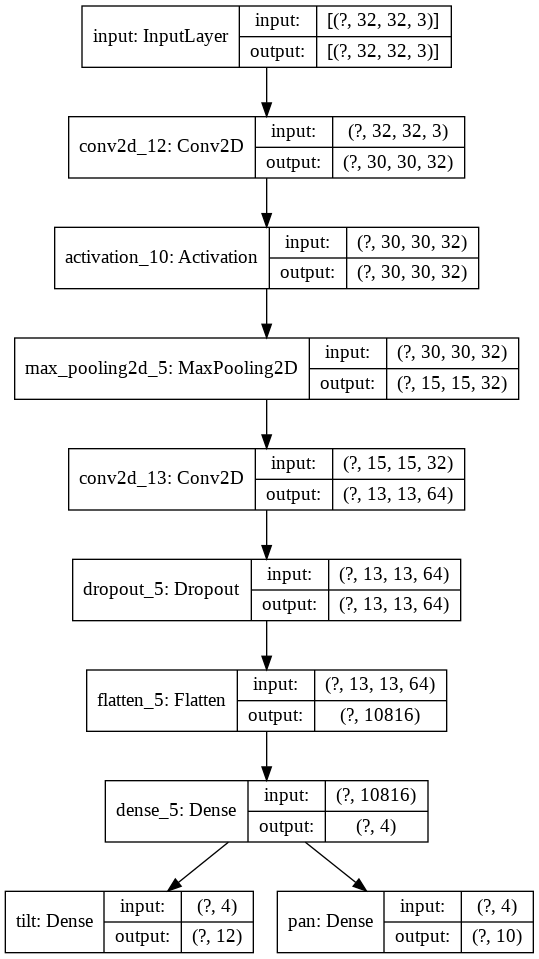

In [87]:
tf.keras.utils.plot_model(model,'test.png',show_shapes=True)

In [88]:
model.summary()

Model: "functional_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_12 (Conv2D)              (None, 30, 30, 32)   896         input[0][0]                      
__________________________________________________________________________________________________
activation_10 (Activation)      (None, 30, 30, 32)   0           conv2d_12[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_5 (MaxPooling2D)  (None, 15, 15, 32)   0           activation_10[0][0]              
______________________________________________________________________________________